In [1]:
from script.model import CNNsimple, CNNdeep, RES, KAN, RKnet
from script.train_new import train_recordedge2, train_recordedge
from script.utils import genimg, crop_2d, MaxMinNormalization
from script.utils import calculate_ssim_psnr, show_image, show_images, calculate_entropy
from script.train import train, train_record
from script.edge_loss import edgeconvloss, EdgeConvloss
from script.perceptual_loss import VGGPerceptualLoss

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import torch
import torchvision
from PIL import Image
import cv2
from skimage.exposure import match_histograms
import os

In [2]:
MZ = 'yxion'
msi_whole = pd.read_feather('cardinal/yx-196features.feather')
msi_data = msi_whole[12].values.reshape(135, 49)

In [5]:
def train_model(model, msi_data
                , modelname
                , mz
                , device
                , factor=20
                , num_epochs=20000
                , interval_epochs =2000
                , lr=0.001
                ):
    os.makedirs(f'metric/{mz}/ckpt/', exist_ok=True)
    os.makedirs(f'metric/{mz}/loss/', exist_ok=True)
    os.makedirs(f'metric/{mz}/output/', exist_ok=True)
    os.makedirs(f'metric/{mz}/matched/', exist_ok=True)
    print('preparing data')
    # prepare data
    opt_data = np.array(Image.open("opt-2.png").convert("RGB"))
    if factor != 20:
      opt_data = cv2.resize(opt_data, None, fx=factor/20, fy=factor/20, interpolation=cv2.INTER_AREA)
    opt_data = np.moveaxis(opt_data, -1, 0)

    msi_upscaled = cv2.resize(msi_data, None, fx=factor, fy=factor, interpolation=cv2.INTER_LINEAR)
    print(msi_upscaled.shape, type(msi_upscaled))
    opt_img = torch.tensor(opt_data, dtype=torch.float32).unsqueeze(0)
    print(opt_img.shape)
    msi_img = torch.tensor(msi_upscaled, dtype=torch.float32).unsqueeze(0).unsqueeze(0)
    print(msi_img.shape)

    # normalize
    opt_img = opt_img / 255
    msi_img = msi_img / torch.max(msi_img) * 20
    print(np.max(msi_img.numpy()), np.min(msi_img.numpy()))
    print(np.max(opt_img.numpy()), np.min(opt_img.numpy()))

    figs = [
          msi_data
        , msi_upscaled
        , np.moveaxis(opt_data, 0, -1)
       ]

    titles = ['MSI', 'MSIupscaled' ,'Optical']

    _, axes = plt.subplots(1,3,subplot_kw = {"xticks":[],"yticks":[]}
                             , figsize = (6, 6)
                            )
    for i, ax in enumerate(axes.flat):
        ax.imshow(figs[i])
        ax.set_title('{}'.format(titles[i]), fontsize = 20, color = 'black')
    plt.tight_layout()
    plt.show()

    print(f'{modelname} training start...')

    trained_model, losses = train_recordedge(model, opt_img, msi_img
                                , device=device
                                , num_epochs=num_epochs
                                , interval_epochs=interval_epochs
                                , save=[f'metric/{mz}/ckpt/', f'metric/{mz}/output/']
                                , lr=lr
                                )
    torch.save(trained_model.state_dict()
                , f'metric/{mz}/ckpt/{mz}-{modelname}-{num_epochs}epochs-x{factor}.pth')
    losses.to_feather(f'metric/{mz}/loss/loss-{mz}-{modelname}-{num_epochs}epochs-x{factor}.feather')
    print(f'{modelname} trained, ckpt saved.')
    fusion = genimg(model, opt_img)
    matched = match_histograms(fusion, msi_data, channel_axis=None)
    np.save(f'metric/{mz}/matched/{mz}-{modelname}-{num_epochs}epochs-x{factor}.npy', matched)
    figs = [
      matched
    , msi_data
    , np.moveaxis(opt_data, 0, -1)
    ]
    titles = ['Result', 'MSI', 'Optical']

    _, axes = plt.subplots(1,3,subplot_kw = {"xticks":[],"yticks":[]}
                        , figsize = (6, 6)
                        )
    for i, ax in enumerate(axes.flat):
        ax.imshow(figs[i])
        ax.set_title('{}'.format(titles[i]), fontsize = 20, color = 'black')
    plt.tight_layout()
    plt.show()

    ssim, psnr = calculate_ssim_psnr(msi_data, matched)
    print(f'ssim: {ssim}, psnr: {psnr}')

    return matched

preparing data
(2700, 980) <class 'numpy.ndarray'>
torch.Size([1, 3, 2700, 980])
torch.Size([1, 1, 2700, 980])
20.0 0.0
1.0 0.1254902


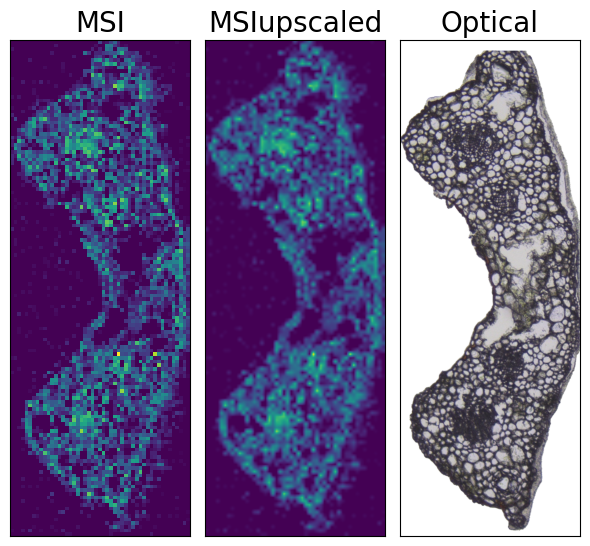

RES training start...


  5%|▌         | 201/4000 [00:14<04:34, 13.82it/s]

Epoch [200/4000], Loss: 4.1729


 10%|█         | 401/4000 [00:28<04:21, 13.78it/s]

Epoch [400/4000], Loss: 4.0630


 15%|█▌        | 601/4000 [00:42<04:04, 13.88it/s]

Epoch [600/4000], Loss: 3.9705


 20%|██        | 801/4000 [00:56<03:51, 13.83it/s]

Epoch [800/4000], Loss: 3.9123


 25%|██▌       | 1001/4000 [01:10<03:35, 13.90it/s]

Epoch [1000/4000], Loss: 3.8714


 30%|███       | 1201/4000 [01:24<03:20, 13.95it/s]

Epoch [1200/4000], Loss: 3.8551


 35%|███▌      | 1401/4000 [01:38<03:06, 13.95it/s]

Epoch [1400/4000], Loss: 3.7948


 40%|████      | 1601/4000 [01:52<02:51, 13.98it/s]

Epoch [1600/4000], Loss: 3.7596


 45%|████▌     | 1801/4000 [02:06<02:37, 13.97it/s]

Epoch [1800/4000], Loss: 3.7220


 50%|█████     | 2001/4000 [02:20<02:23, 13.92it/s]

Epoch [2000/4000], Loss: 3.7122


 55%|█████▌    | 2201/4000 [02:34<02:08, 13.96it/s]

Epoch [2200/4000], Loss: 3.6083


 60%|██████    | 2401/4000 [02:48<01:54, 13.95it/s]

Epoch [2400/4000], Loss: 3.5610


 65%|██████▌   | 2601/4000 [03:02<01:40, 13.96it/s]

Epoch [2600/4000], Loss: 3.5355


 70%|███████   | 2801/4000 [03:16<01:25, 13.98it/s]

Epoch [2800/4000], Loss: 3.5408


 75%|███████▌  | 3001/4000 [03:30<01:11, 13.92it/s]

Epoch [3000/4000], Loss: 3.4725


 80%|████████  | 3201/4000 [03:44<00:57, 13.97it/s]

Epoch [3200/4000], Loss: 3.4424


 85%|████████▌ | 3401/4000 [03:58<00:43, 13.88it/s]

Epoch [3400/4000], Loss: 3.4289


 90%|█████████ | 3601/4000 [04:12<00:28, 13.97it/s]

Epoch [3600/4000], Loss: 3.7759


 95%|█████████▌| 3801/4000 [04:26<00:14, 13.99it/s]

Epoch [3800/4000], Loss: 3.4178


100%|██████████| 4000/4000 [04:40<00:00, 14.28it/s]


Epoch [4000/4000], Loss: 3.4000
RES trained, ckpt saved.


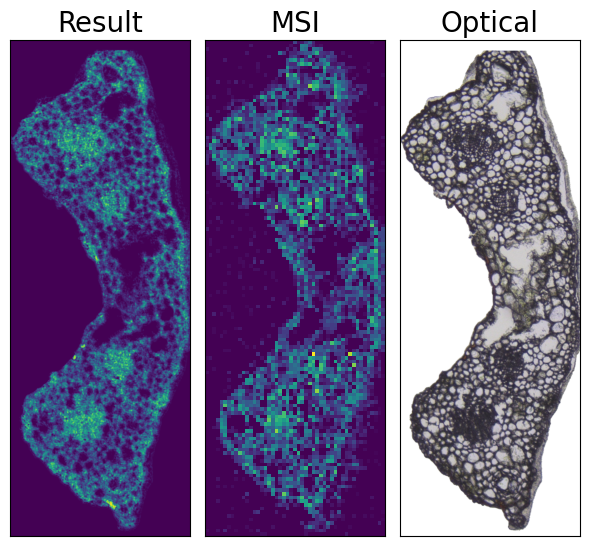

ssim: 0.5309577732431237, psnr: 17.42554683869662


In [4]:
model = RES()
modelname = 'RES'

res_img_x20 = train_model(model, msi_data
                , modelname=modelname
                , mz='yxion-long'
                , device=6
                , factor=20
                , num_epochs=4000
                , lr=0.0003
                )

In [4]:
index = range(199, 4000, 200)
img_list = []
for i in index:
    fusion = np.load(f'metric/yxion-long/output/{i}.npy').reshape(2700, 980)
    img = match_histograms(fusion, msi_data, channel_axis=None)
    img_list.append(img)

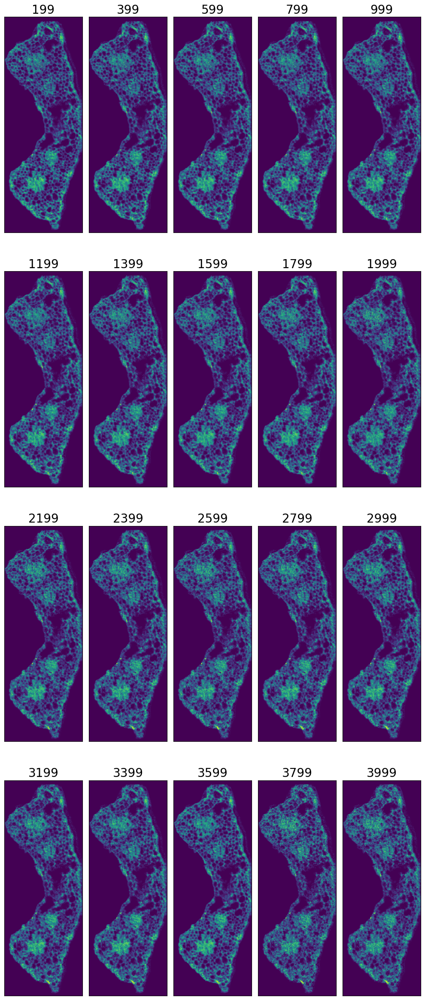

In [5]:
_, axes = plt.subplots(4,5,subplot_kw = {"xticks":[],"yticks":[]} # row, col
                            , figsize = (1*5*2, 3*4*2)  # figsize = (width, height)
                        )                               # pic_w*col*n, pic_h*row*n
for i, ax in enumerate(axes.flat):
    ax.imshow(img_list[i])
    ax.set_title(f'{index[i]}', fontsize = 20, color = 'black')
plt.tight_layout()
plt.show()

In [6]:
def train_model(model, msi_data
                , modelname
                , mz
                , device
                , factor=20
                , num_epochs=20000
                , interval_epochs =2000
                , lr=0.001
                ):
    os.makedirs(f'metric/{mz}/ckpt/', exist_ok=True)
    os.makedirs(f'metric/{mz}/loss/', exist_ok=True)
    os.makedirs(f'metric/{mz}/output/', exist_ok=True)
    os.makedirs(f'metric/{mz}/matched/', exist_ok=True)
    print('preparing data')
    # prepare data
    opt_data = np.array(Image.open("opt-2.png").convert("RGB"))
    if factor != 20:
      opt_data = cv2.resize(opt_data, None, fx=factor/20, fy=factor/20, interpolation=cv2.INTER_AREA)
    opt_data = np.moveaxis(opt_data, -1, 0)

    msi_upscaled = cv2.resize(msi_data, None, fx=factor, fy=factor, interpolation=cv2.INTER_LINEAR)
    print(msi_upscaled.shape, type(msi_upscaled))
    opt_img = torch.tensor(opt_data, dtype=torch.float32).unsqueeze(0)
    print(opt_img.shape)
    msi_img = torch.tensor(msi_upscaled, dtype=torch.float32).unsqueeze(0).unsqueeze(0)
    print(msi_img.shape)

    # normalize
    opt_img = opt_img / 255
    msi_img = msi_img / torch.max(msi_img) * 20
    print(np.max(msi_img.numpy()), np.min(msi_img.numpy()))
    print(np.max(opt_img.numpy()), np.min(opt_img.numpy()))

    figs = [
          msi_data
        , msi_upscaled
        , np.moveaxis(opt_data, 0, -1)
       ]

    titles = ['MSI', 'MSIupscaled' ,'Optical']

    _, axes = plt.subplots(1,3,subplot_kw = {"xticks":[],"yticks":[]}
                             , figsize = (6, 6)
                            )
    for i, ax in enumerate(axes.flat):
        ax.imshow(figs[i])
        ax.set_title('{}'.format(titles[i]), fontsize = 20, color = 'black')
    plt.tight_layout()
    plt.show()

    print(f'{modelname} training start...')

    trained_model, losses = train_recordedge2(model, opt_img, msi_img
                                , device=device
                                , num_epochs=num_epochs
                                , interval_epochs=interval_epochs
                                , save=[f'metric/{mz}/ckpt/', f'metric/{mz}/output/']
                                , lr=lr
                                )
    torch.save(trained_model.state_dict()
                , f'metric/{mz}/ckpt/{mz}-{modelname}-{num_epochs}epochs-x{factor}.pth')
    losses.to_feather(f'metric/{mz}/loss/loss-{mz}-{modelname}-{num_epochs}epochs-x{factor}.feather')
    print(f'{modelname} trained, ckpt saved.')
    fusion = genimg(model, opt_img)
    matched = match_histograms(fusion, msi_data, channel_axis=None)
    np.save(f'metric/{mz}/matched/{mz}-{modelname}-{num_epochs}epochs-x{factor}.npy', matched)
    figs = [
      matched
    , msi_data
    , np.moveaxis(opt_data, 0, -1)
    ]
    titles = ['Result', 'MSI', 'Optical']

    _, axes = plt.subplots(1,3,subplot_kw = {"xticks":[],"yticks":[]}
                        , figsize = (6, 6)
                        )
    for i, ax in enumerate(axes.flat):
        ax.imshow(figs[i])
        ax.set_title('{}'.format(titles[i]), fontsize = 20, color = 'black')
    plt.tight_layout()
    plt.show()

    ssim, psnr = calculate_ssim_psnr(msi_data, matched)
    print(f'ssim: {ssim}, psnr: {psnr}')

    return matched

preparing data
(2700, 980) <class 'numpy.ndarray'>
torch.Size([1, 3, 2700, 980])
torch.Size([1, 1, 2700, 980])
20.0 0.0
1.0 0.1254902


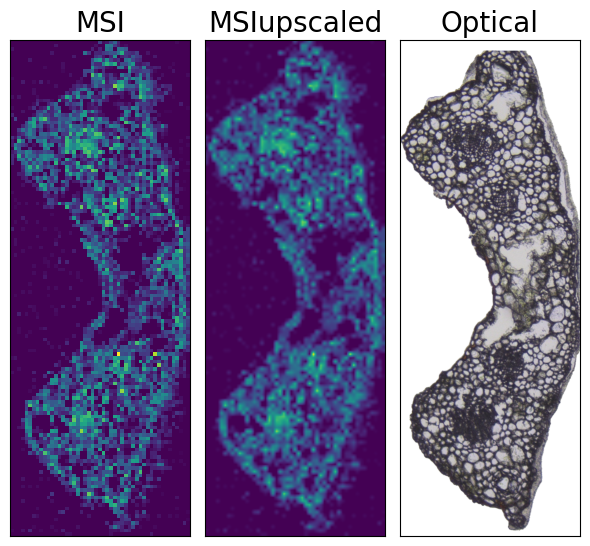

RES training start...


  0%|          | 11/10000 [00:01<14:20, 11.61it/s] 

Epoch [10/10000], Loss: 7.8208


  0%|          | 21/10000 [00:01<12:30, 13.30it/s]

Epoch [20/10000], Loss: 6.7046


  0%|          | 31/10000 [00:02<12:05, 13.74it/s]

Epoch [30/10000], Loss: 6.1073


  0%|          | 41/10000 [00:03<12:01, 13.81it/s]

Epoch [40/10000], Loss: 5.6292


  1%|          | 51/10000 [00:04<11:56, 13.89it/s]

Epoch [50/10000], Loss: 5.1844


  1%|          | 61/10000 [00:04<11:59, 13.82it/s]

Epoch [60/10000], Loss: 4.8529


  1%|          | 71/10000 [00:05<11:56, 13.86it/s]

Epoch [70/10000], Loss: 4.6144


  1%|          | 81/10000 [00:06<12:01, 13.75it/s]

Epoch [80/10000], Loss: 4.4528


  1%|          | 91/10000 [00:06<11:52, 13.90it/s]

Epoch [90/10000], Loss: 4.3364


  1%|          | 101/10000 [00:07<11:53, 13.87it/s]

Epoch [100/10000], Loss: 4.2514


  1%|          | 111/10000 [00:08<11:56, 13.81it/s]

Epoch [110/10000], Loss: 4.2092


  1%|          | 121/10000 [00:09<11:57, 13.77it/s]

Epoch [120/10000], Loss: 4.1814


  1%|▏         | 131/10000 [00:09<11:52, 13.85it/s]

Epoch [130/10000], Loss: 4.1607


  1%|▏         | 141/10000 [00:10<11:52, 13.83it/s]

Epoch [140/10000], Loss: 4.1436


  2%|▏         | 151/10000 [00:11<12:02, 13.64it/s]

Epoch [150/10000], Loss: 4.1272


  2%|▏         | 161/10000 [00:11<11:50, 13.85it/s]

Epoch [160/10000], Loss: 4.1128


  2%|▏         | 171/10000 [00:12<11:49, 13.85it/s]

Epoch [170/10000], Loss: 4.1032


  2%|▏         | 181/10000 [00:13<11:51, 13.80it/s]

Epoch [180/10000], Loss: 4.0877


  2%|▏         | 191/10000 [00:14<11:46, 13.88it/s]

Epoch [190/10000], Loss: 4.0772


  2%|▏         | 201/10000 [00:14<11:49, 13.82it/s]

Epoch [200/10000], Loss: 4.0709


  4%|▍         | 401/10000 [00:28<11:31, 13.88it/s]

Epoch [400/10000], Loss: 3.9649


  6%|▌         | 601/10000 [00:42<11:15, 13.91it/s]

Epoch [600/10000], Loss: 3.8732


  8%|▊         | 801/10000 [00:56<10:59, 13.94it/s]

Epoch [800/10000], Loss: 3.8162


 10%|█         | 1001/10000 [01:10<10:51, 13.81it/s]

Epoch [1000/10000], Loss: 3.7751


 12%|█▏        | 1201/10000 [01:24<10:33, 13.89it/s]

Epoch [1200/10000], Loss: 3.7362


 14%|█▍        | 1401/10000 [01:38<10:19, 13.88it/s]

Epoch [1400/10000], Loss: 3.6955


 16%|█▌        | 1601/10000 [01:52<10:08, 13.81it/s]

Epoch [1600/10000], Loss: 3.6595


 18%|█▊        | 1801/10000 [02:06<09:48, 13.93it/s]

Epoch [1800/10000], Loss: 3.6134


 20%|██        | 2001/10000 [02:20<09:35, 13.90it/s]

Epoch [2000/10000], Loss: 3.5943


 22%|██▏       | 2201/10000 [02:34<09:22, 13.86it/s]

Epoch [2200/10000], Loss: 3.5687


 24%|██▍       | 2401/10000 [02:48<09:06, 13.92it/s]

Epoch [2400/10000], Loss: 3.5391


 26%|██▌       | 2601/10000 [03:02<08:50, 13.93it/s]

Epoch [2600/10000], Loss: 3.5035


 28%|██▊       | 2801/10000 [03:16<08:36, 13.93it/s]

Epoch [2800/10000], Loss: 3.4778


 30%|███       | 3001/10000 [03:30<08:23, 13.89it/s]

Epoch [3000/10000], Loss: 3.4688


 32%|███▏      | 3201/10000 [03:44<08:10, 13.88it/s]

Epoch [3200/10000], Loss: 3.4745


 34%|███▍      | 3401/10000 [03:58<07:53, 13.93it/s]

Epoch [3400/10000], Loss: 3.4150


 36%|███▌      | 3601/10000 [04:12<07:44, 13.79it/s]

Epoch [3600/10000], Loss: 3.4317


 38%|███▊      | 3801/10000 [04:26<07:24, 13.95it/s]

Epoch [3800/10000], Loss: 3.4151


 40%|████      | 4001/10000 [04:40<07:10, 13.92it/s]

Epoch [4000/10000], Loss: 3.3665


 50%|█████     | 5001/10000 [05:51<06:00, 13.87it/s]

Epoch [5000/10000], Loss: 3.2849


 60%|██████    | 6001/10000 [07:00<04:47, 13.93it/s]

Epoch [6000/10000], Loss: 3.2740


 70%|███████   | 7001/10000 [08:10<03:35, 13.90it/s]

Epoch [7000/10000], Loss: 3.2079


 80%|████████  | 8001/10000 [09:20<02:23, 13.91it/s]

Epoch [8000/10000], Loss: 3.1604


 90%|█████████ | 9001/10000 [10:31<01:11, 13.88it/s]

Epoch [9000/10000], Loss: 3.1157


100%|██████████| 10000/10000 [11:40<00:00, 14.27it/s]


RES trained, ckpt saved.


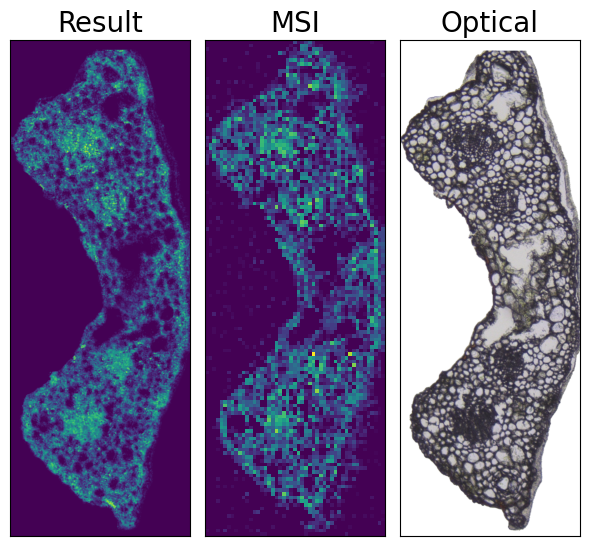

ssim: 0.5401646184752115, psnr: 16.485566597390843


In [7]:
model = RES()
modelname = 'RES'

res_img_x20 = train_model(model, msi_data
                , modelname=modelname
                , mz='yxion-all'
                , device=6
                , factor=20
                , num_epochs=10000
                , lr=0.0003
                )

In [8]:
index_all = []
for item in os.listdir('metric/yxion-all/output/'):
    i = int(item.split('.')[0])
    index_all.append(i)
index_all.sort()

In [23]:
img_list = []
for i in index_all:
    fusion = np.load(f'metric/yxion-all/output/{i}.npy').reshape(2700, 980)
    img = match_histograms(fusion, msi_data, channel_axis=None)
    img_list.append(img)

In [32]:
len(img_list)

44

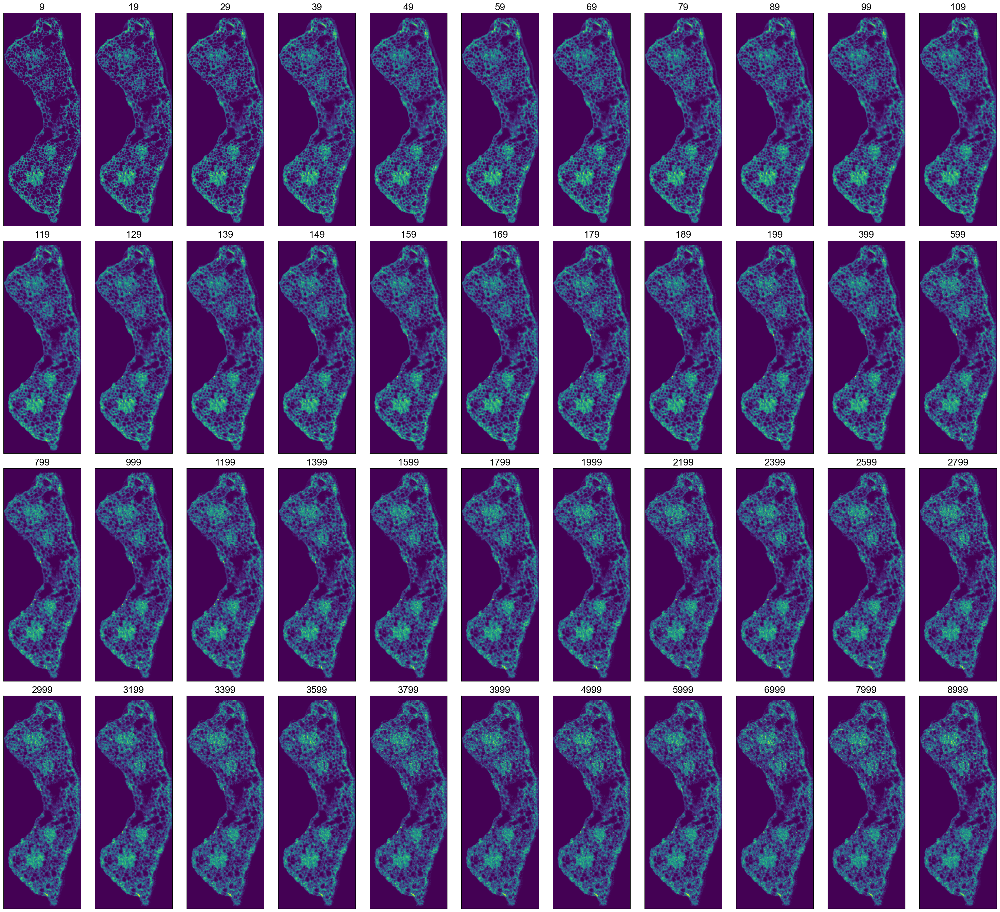

In [35]:
_, axes = plt.subplots(4,11,subplot_kw = {"xticks":[],"yticks":[]} # row, col
                            , figsize = (1*5*6, 3*9*1)  # figsize = (width, height)
                        )                               # pic_w*col*n, pic_h*row*n
for i, ax in enumerate(axes.flat):

    ax.imshow(img_list[i])
    ax.set_title(f'{index_all[i]}', fontsize = 20, color = 'black')
plt.tight_layout()
plt.show()

In [ ]:
loss = pd.read_feather(f'metric/yxion-all/loss/loss-yxion-all-RES-10000epochs-x20.feather')
loss

,mse_loss,edge_loss
0,13.773070,29.699535
1,11.582891,19.475109
2,10.500497,11.210243
3,9.990694,7.271439
4,9.384720,6.167045
...,...,...
9995,3.076196,6.559523
9996,3.079956,6.395155
9997,3.081581,6.448196
9998,3.081798,6.594771


In [7]:
loss['edge_loss'].min()

0.6662010550498962

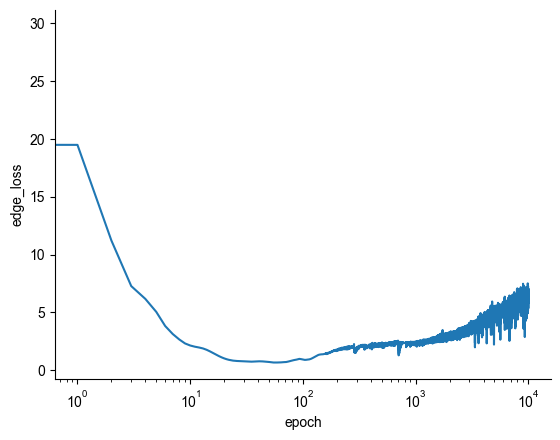

In [9]:
plt.rcParams["font.family"] = "Arial"
plt.plot(loss.loc[0:].index, loss.loc[0:]['edge_loss'], label='eloss'
        #  , markevery=index, marker='o', mfc='red'
         )
# plt.plot(loss.index, loss['mse_loss'], label='mloss')
plt.xlabel('epoch')
plt.ylabel('edge_loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

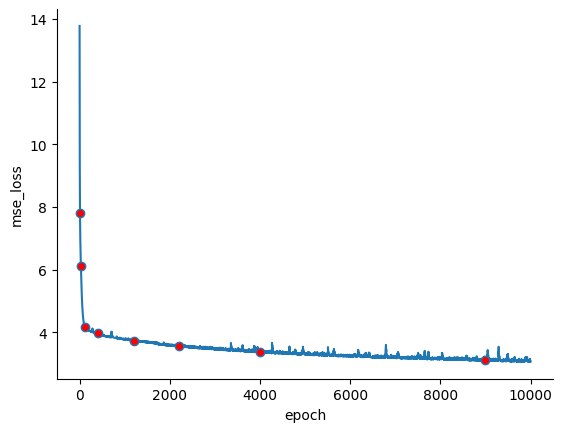

In [71]:
plt.plot(loss.loc[0:].index, loss.loc[0:]['mse_loss'], label='mloss', markevery=index, marker='o', mfc='red')
plt.xlabel('epoch')
plt.ylabel('mse_loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
# ax.set_xscale('log')

In [9]:
metric_df = pd.DataFrame(columns=['SSIM to opt', 'PSNR to opt', 'SSIM to msi', 'PSNR to msi'])
opt = np.array(Image.open('opt-2.png').convert('L'))
for i in index_all:
    fusion = np.load(f'metric/yxion-all/output/{i}.npy').reshape(2700, 980)
    img = match_histograms(fusion, msi_data, channel_axis=None)
    metric_df.loc[i] = calculate_ssim_psnr(opt, img)[0], calculate_ssim_psnr(opt, img)[1], calculate_ssim_psnr(msi_data, img)[0], calculate_ssim_psnr(msi_data, img)[1]

In [26]:
metric_df

,SSIM to opt,PSNR to opt,SSIM to msi,PSNR to msi
9,-0.099564,2.832724,0.364693,15.842793
19,-0.109142,2.847507,0.369103,15.756495
29,-0.103897,2.863282,0.371562,15.646705
39,-0.104097,2.894937,0.374652,15.281840
49,-0.096711,2.899195,0.377155,15.380885
59,-0.084486,2.902377,0.375798,15.373646
69,-0.075898,2.905603,0.379629,15.412479
79,-0.044089,2.920159,0.383419,15.444050
89,-0.032803,2.924250,0.383144,15.401837
99,-0.017114,2.934103,0.383515,15.377998


In [10]:
v_loss = VGGPerceptualLoss()
opt_l = np.array(Image.open('opt-2.png').convert('L'))
opt_l = opt_l/np.max(opt_l).astype(np.float32)

for i in index_all:
    fusion = np.load(f'metric/yxion-all/output/{i}.npy').reshape(2700, 980)
    img = match_histograms(fusion, msi_data, channel_axis=None).astype(np.float32)
    img_tensor = torch.tensor(img).unsqueeze(0).unsqueeze(0)
    msi_datatensor = torch.tensor(cv2.resize(msi_data, None, fx=20, fy=20, interpolation=cv2.INTER_LINEAR).astype(np.float32)).unsqueeze(0).unsqueeze(0)
    metric_df.loc[i, 'Perceptual loss to opt'] = v_loss(img_tensor, torch.tensor(opt_l).unsqueeze(0).unsqueeze(0)).item()
    metric_df.loc[i, 'Perceptual loss to msi'] = v_loss(img_tensor, msi_datatensor).item()

/root/miniconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/root/miniconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [28]:
metric_df

,SSIM to opt,PSNR to opt,SSIM to msi,PSNR to msi,Perceptual loss to opt,Perceptual loss to msi
9,-0.099564,2.832724,0.364693,15.842793,219.013901,243.906921
19,-0.109142,2.847507,0.369103,15.756495,217.877319,239.340851
29,-0.103897,2.863282,0.371562,15.646705,218.776154,238.191544
39,-0.104097,2.894937,0.374652,15.281840,220.556519,239.316544
49,-0.096711,2.899195,0.377155,15.380885,218.594528,238.094986
59,-0.084486,2.902377,0.375798,15.373646,217.005203,235.360260
69,-0.075898,2.905603,0.379629,15.412479,216.373260,235.160553
79,-0.044089,2.920159,0.383419,15.444050,214.734360,234.215958
89,-0.032803,2.924250,0.383144,15.401837,213.419601,232.543716
99,-0.017114,2.934103,0.383515,15.377998,212.388016,231.786743


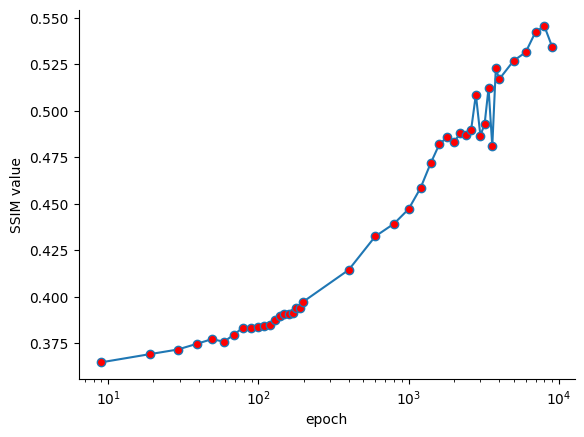

In [31]:
plt.plot(index, metric_df['SSIM to msi'], label='loss', marker='o', mfc='red')
plt.xlabel('epoch')
plt.ylabel('SSIM value')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

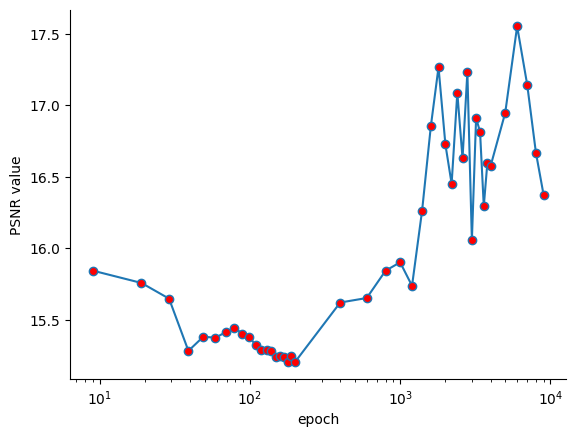

In [34]:
plt.plot(index, metric_df['PSNR to msi'], label='loss', marker='o', mfc='red')
plt.xlabel('epoch')
plt.ylabel('PSNR value')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

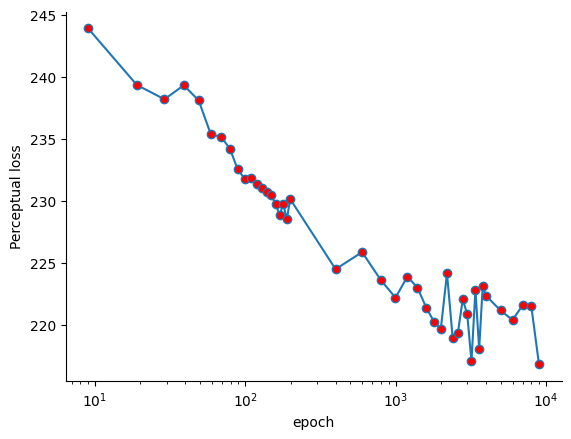

In [35]:
plt.plot(index, metric_df['Perceptual loss to msi'], label='loss', marker='o', mfc='red')
plt.xlabel('epoch')
plt.ylabel('Perceptual loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

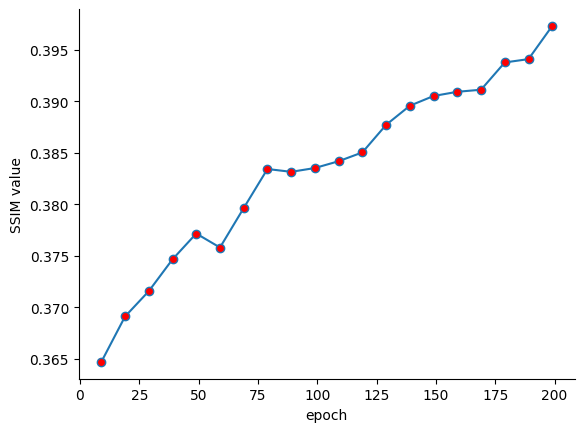

In [43]:
index = range(9, 200, 10)

In [ ]:
plt.plot(index, metric_df.loc[index]['SSIM to msi'], label='loss', marker='o', mfc='red')
plt.xlabel('epoch')
plt.ylabel('SSIM value')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')

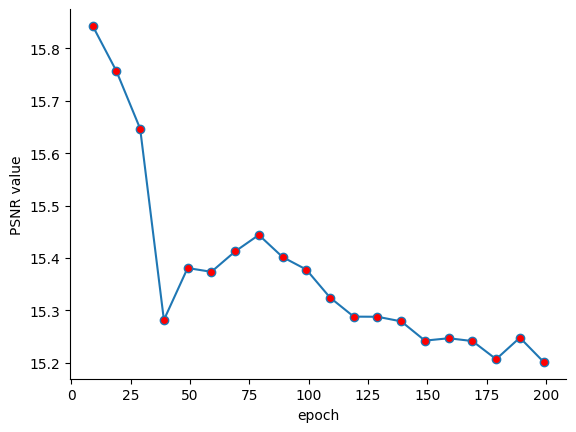

In [44]:
index = range(9, 200, 10)
plt.plot(index, metric_df.loc[index]['PSNR to msi'], label='loss', marker='o', mfc='red')
plt.xlabel('epoch')
plt.ylabel('PSNR value')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')

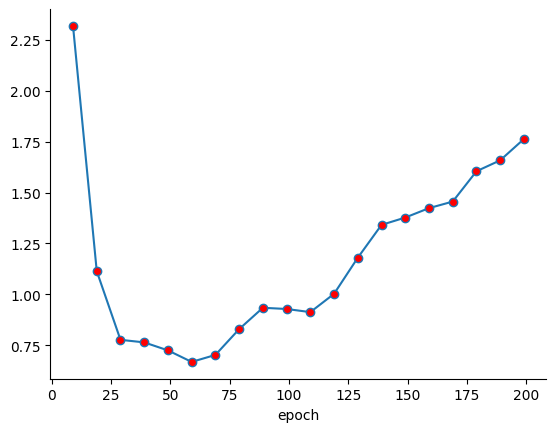

In [45]:
index = range(9, 200, 10)
plt.plot(index, loss.loc[index]['edge_loss'], label='loss', marker='o', mfc='red')
plt.xlabel('epoch')
# plt.ylabel('PSNR value')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')

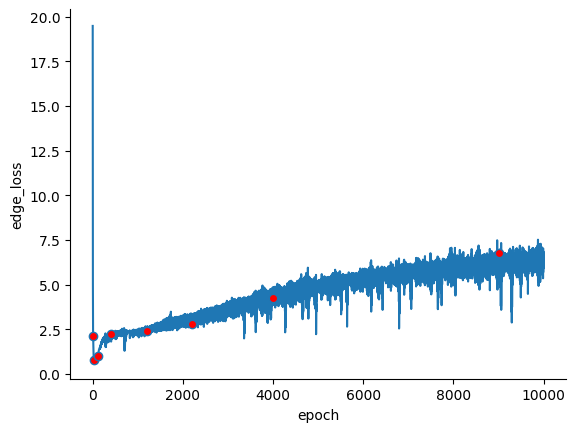

In [56]:
index = [9,29,119,399,1199,2199,3999,8999]
plt.plot(loss.loc[1:].index, loss.loc[1:]['edge_loss'], label='eloss'
         , markevery=index, marker='o', mfc='red'
         )
# plt.plot(loss.index, loss['mse_loss'], label='mloss')
plt.xlabel('epoch')
plt.ylabel('edge_loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
# ax.set_xscale('log')

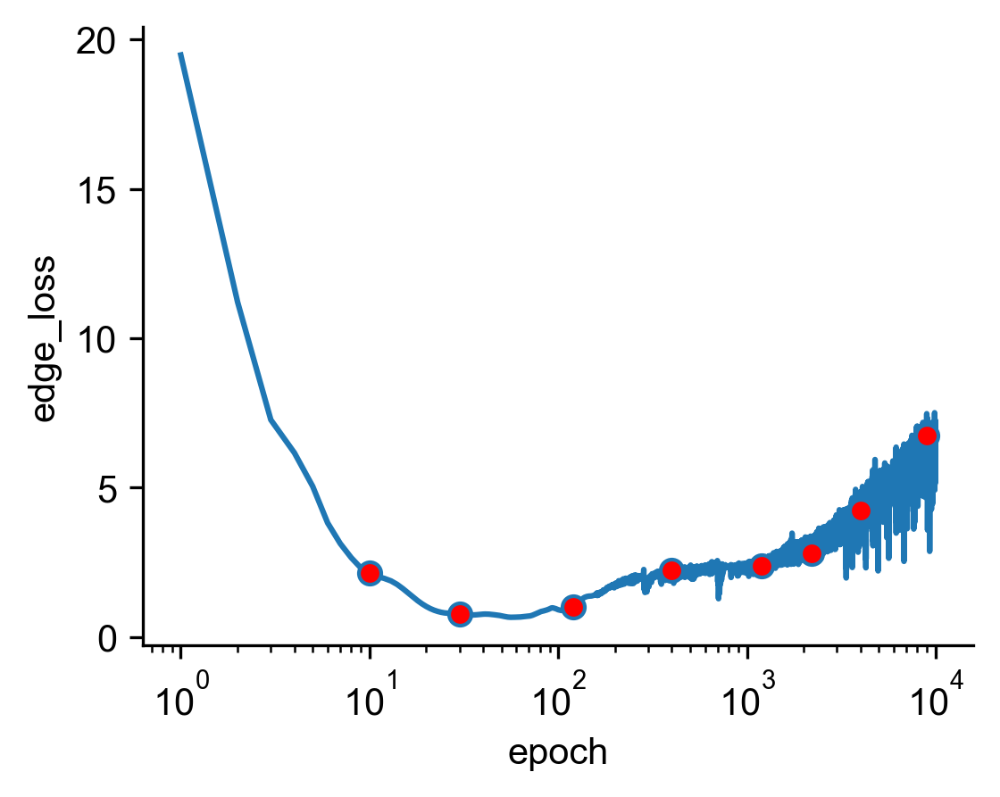

In [10]:
index = [9,29,119,399,1199,2199,3999,8999]
plt.rcParams["font.family"] = "Arial"
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(loss.loc[1:].index, loss.loc[1:]['edge_loss'], label='eloss'
         , markevery=index, marker='o', mfc='red'
         )
# plt.plot(loss.index, loss['mse_loss'], label='mloss')
plt.xlabel('epoch')
plt.ylabel('edge_loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

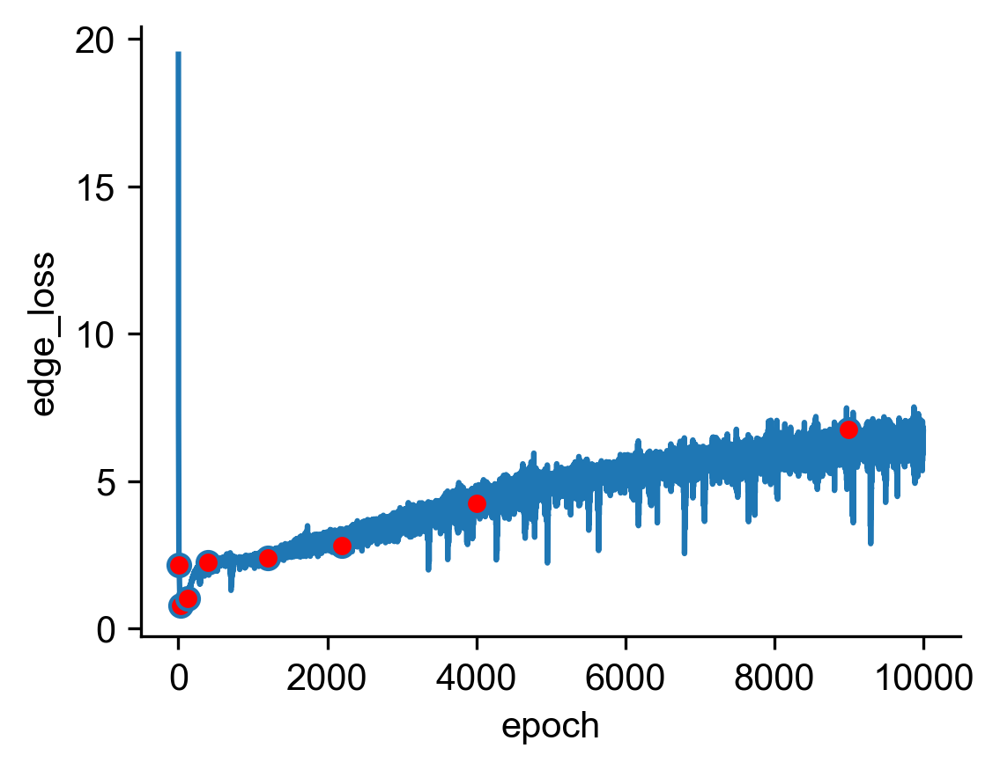

In [4]:
index = [9,29,119,399,1199,2199,3999,8999]
plt.rcParams["font.family"] = "Arial"
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(loss.loc[1:].index, loss.loc[1:]['edge_loss'], label='eloss'
         , markevery=index, marker='o', mfc='red'
         )
# plt.plot(loss.index, loss['mse_loss'], label='mloss')
plt.xlabel('epoch')
plt.ylabel('edge_loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
# ax.set_xscale('log')

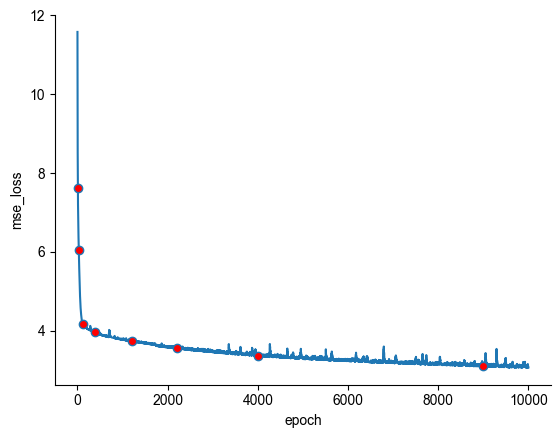

In [11]:
index = [9,29,119,399,1199,2199,3999,8999]
plt.plot(loss.loc[1:].index, loss.loc[1:]['mse_loss'], label='eloss'
         , markevery=index, marker='o', mfc='red'
         )
# plt.plot(loss.index, loss['mse_loss'], label='mloss')
plt.xlabel('epoch')
plt.ylabel('mse_loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
# ax.set_xscale('log')

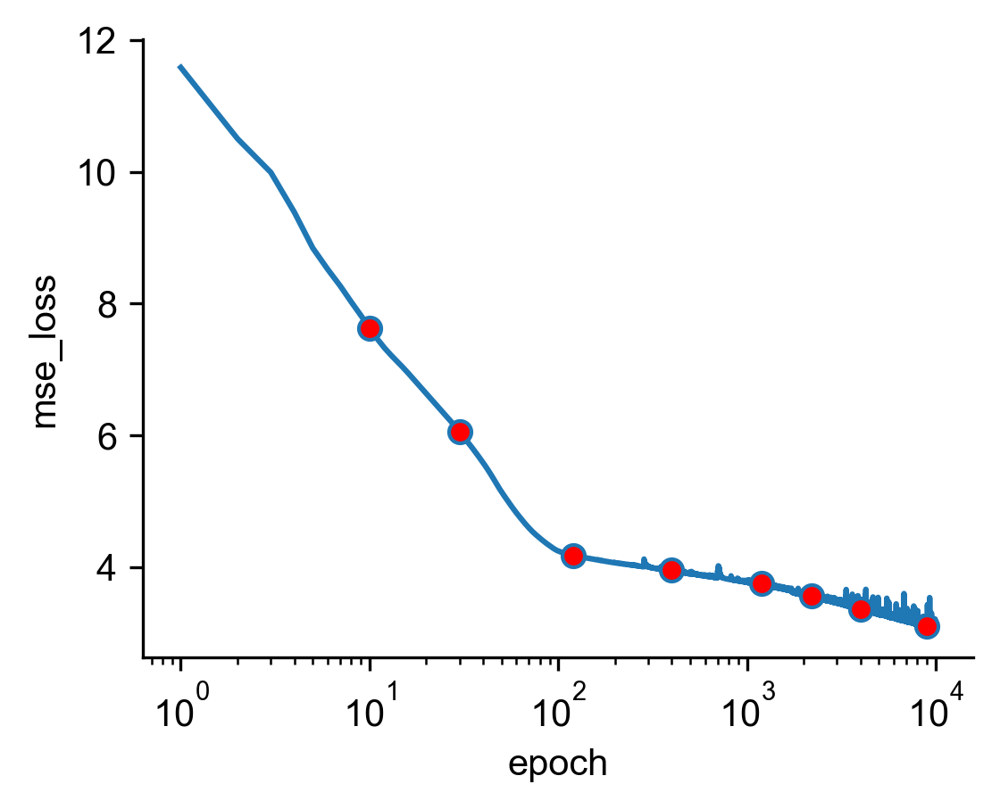

In [12]:
index = [9,29,119,399,1199,2199,3999,8999]
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(loss.loc[1:].index, loss.loc[1:]['mse_loss'], label='eloss'
         , markevery=index, marker='o', mfc='red'
         )
# plt.plot(loss.index, loss['mse_loss'], label='mloss')
plt.xlabel('epoch')
plt.ylabel('mse_loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

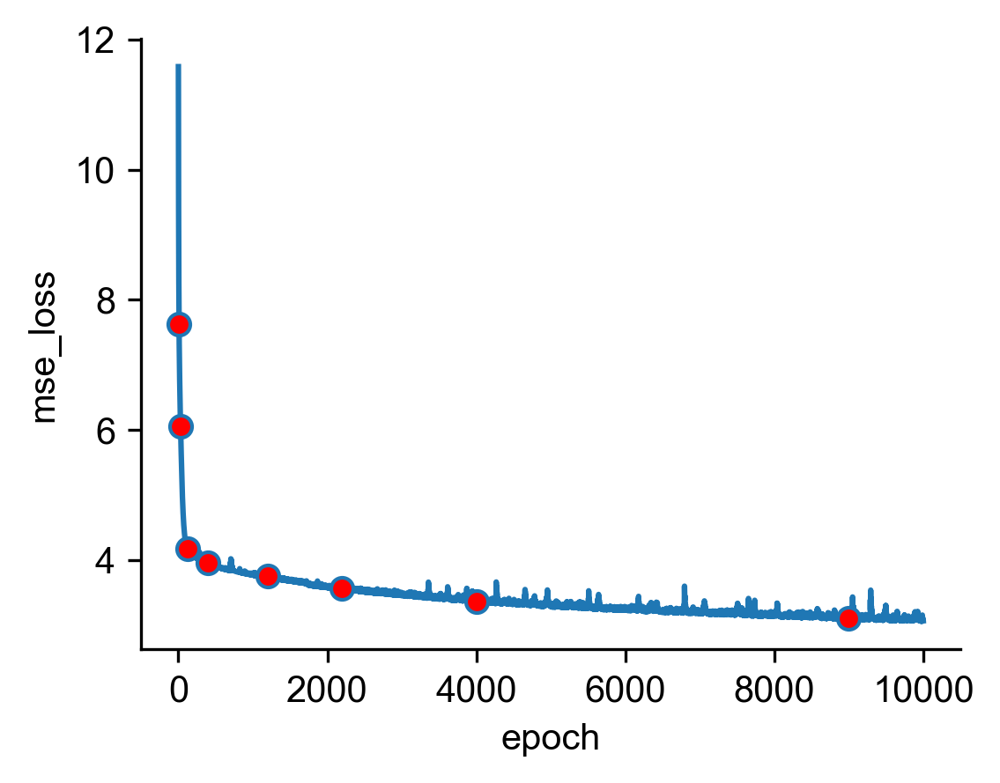

In [5]:
index = [9,29,119,399,1199,2199,3999,8999]
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(loss.loc[1:].index, loss.loc[1:]['mse_loss'], label='eloss'
         , markevery=index, marker='o', mfc='red'
         )
# plt.plot(loss.index, loss['mse_loss'], label='mloss')
plt.xlabel('epoch')
plt.ylabel('mse_loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
# ax.set_xscale('log')

In [110]:
indice = [index_all.index(item) for item in index]

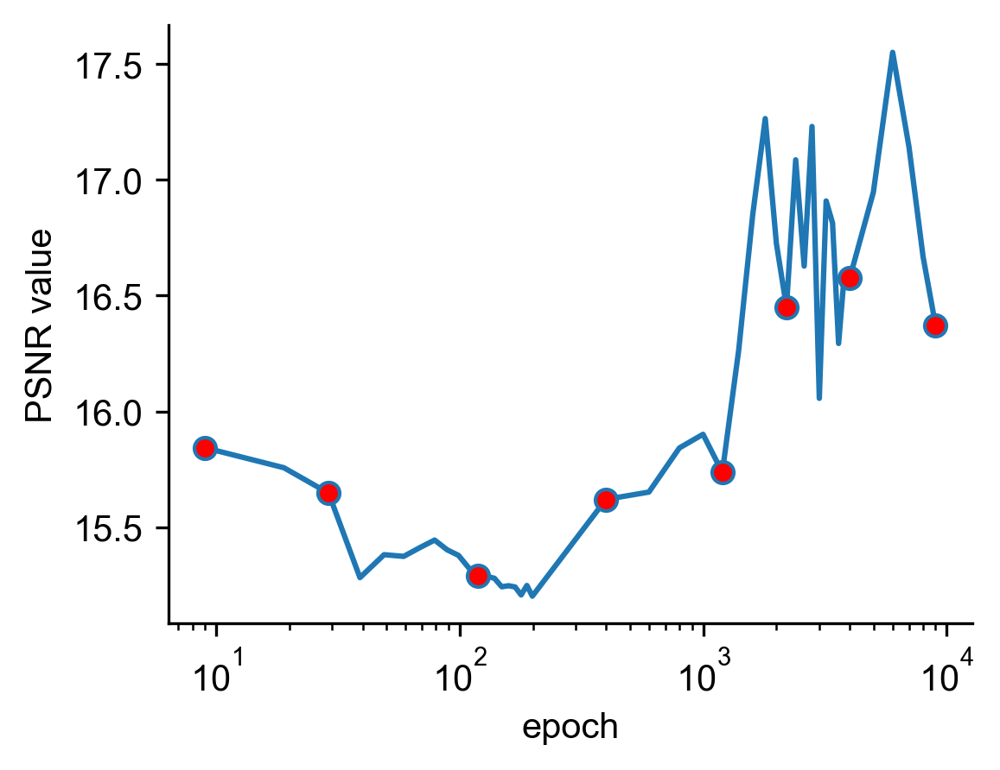

In [16]:
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(index_all, metric_df['PSNR to msi'], label='loss'
         , markevery=[0, 2, 11, 20, 24, 29, 38, 43], marker='o', mfc='red'
         )
plt.xlabel('epoch')
plt.ylabel('PSNR value')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

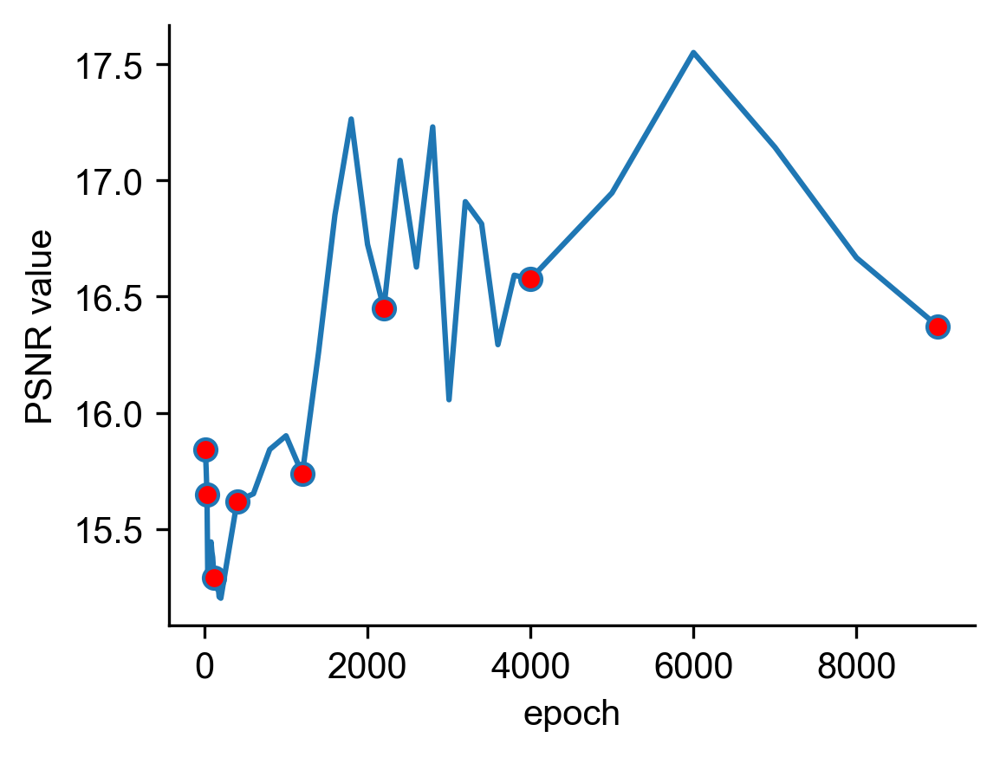

In [11]:
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(index_all, metric_df['PSNR to msi'], label='loss'
         , markevery=[0, 2, 11, 20, 24, 29, 38, 43], marker='o', mfc='red'
         )
plt.xlabel('epoch')
plt.ylabel('PSNR value')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
# ax.set_xscale('log')

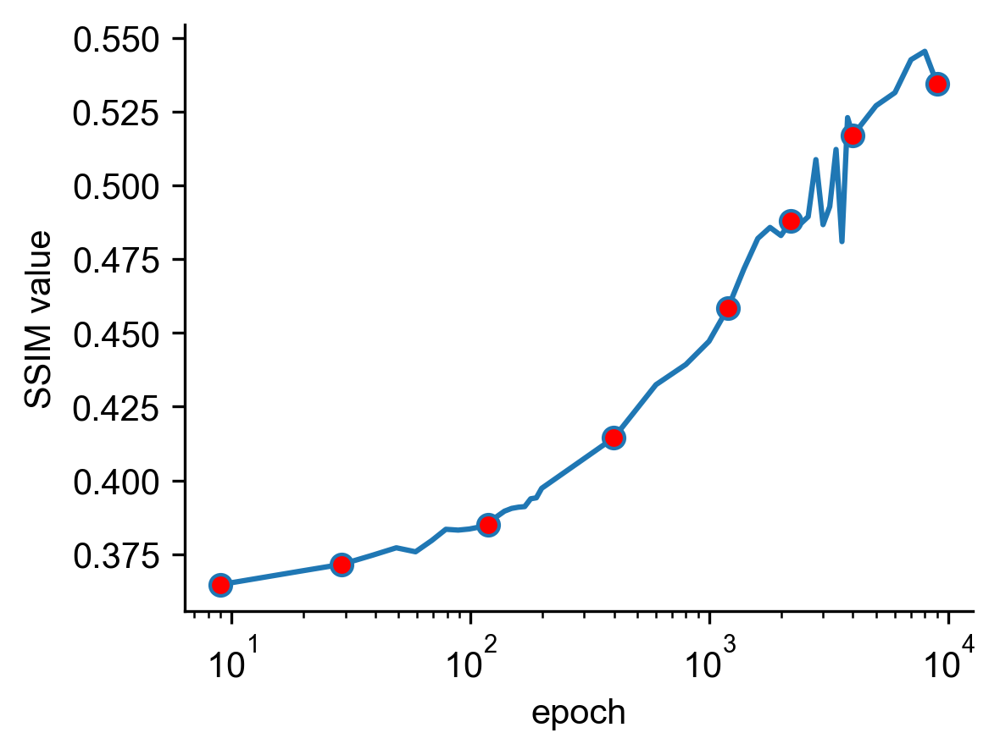

In [17]:
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(index_all, metric_df['SSIM to msi'], label='loss'
         , markevery=[0, 2, 11, 20, 24, 29, 38, 43], marker='o', mfc='red'
         )
plt.xlabel('epoch')
plt.ylabel('SSIM value')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

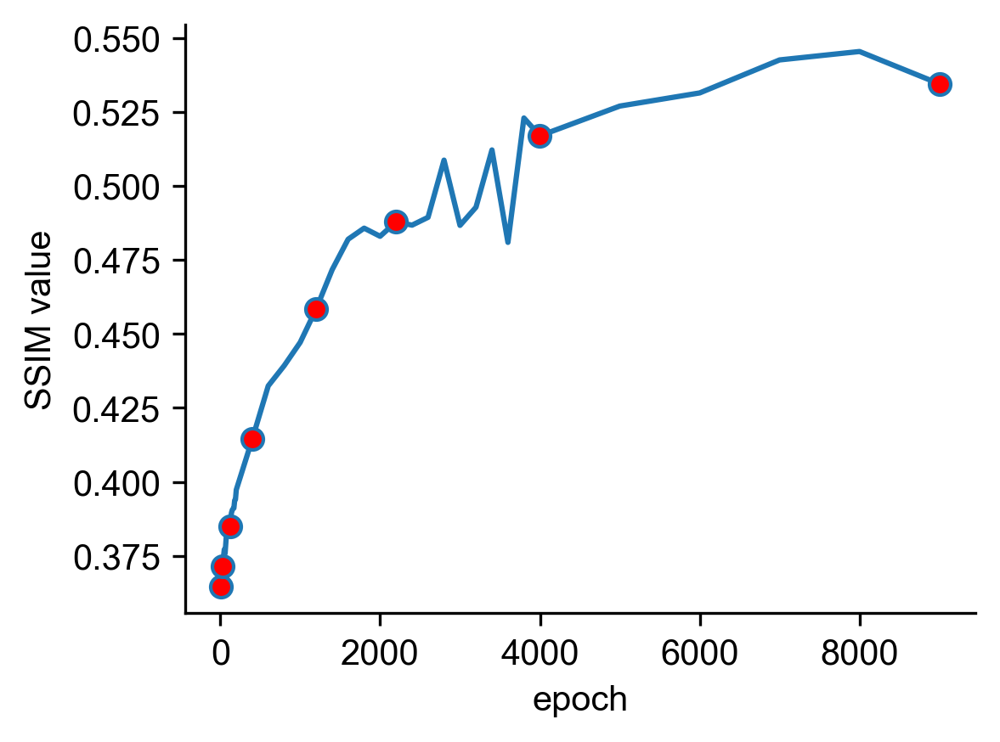

In [12]:
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(index_all, metric_df['SSIM to msi'], label='loss'
         , markevery=[0, 2, 11, 20, 24, 29, 38, 43], marker='o', mfc='red'
         )
plt.xlabel('epoch')
plt.ylabel('SSIM value')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
# ax.set_xscale('log')

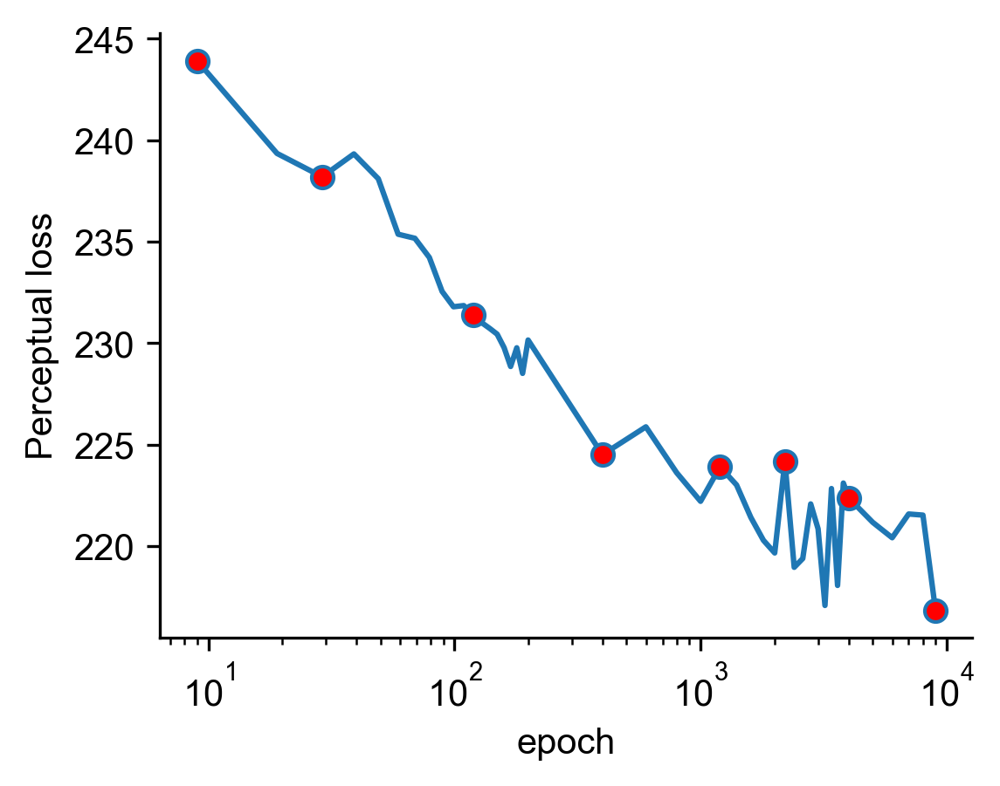

In [18]:
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(index_all, metric_df['Perceptual loss to msi'], label='loss'
         , markevery=[0, 2, 11, 20, 24, 29, 38, 43], marker='o', mfc='red'
         )
plt.xlabel('epoch')
plt.ylabel('Perceptual loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

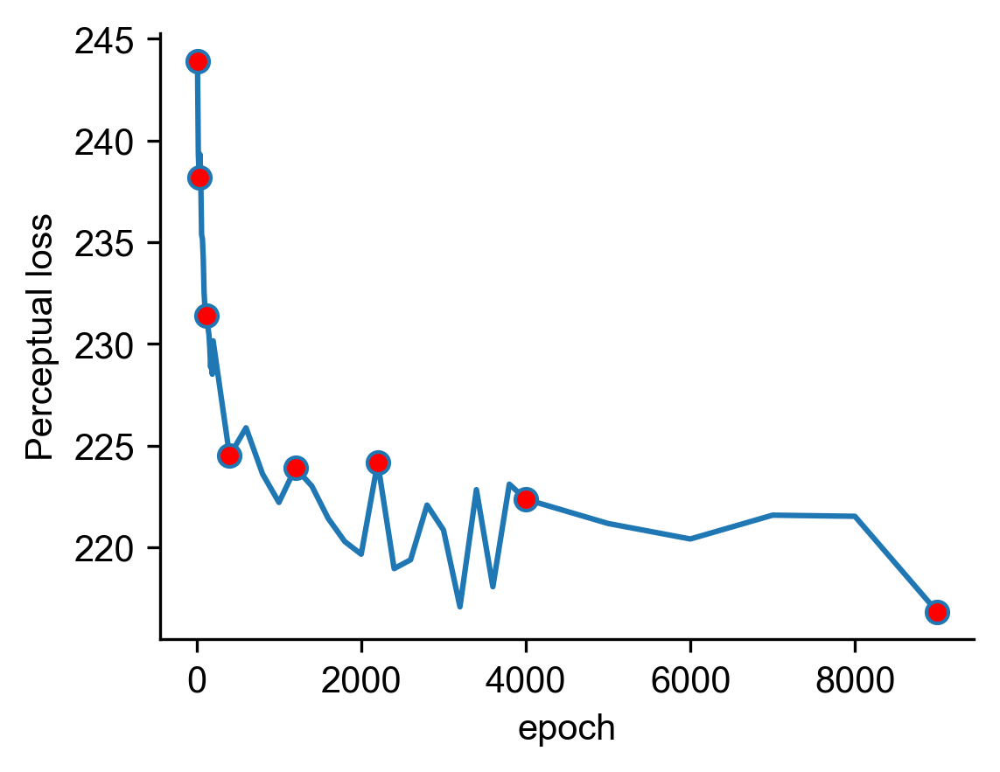

In [13]:
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(index_all, metric_df['Perceptual loss to msi'], label='loss'
         , markevery=[0, 2, 11, 20, 24, 29, 38, 43], marker='o', mfc='red'
         )
plt.xlabel('epoch')
plt.ylabel('Perceptual loss')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
# ax.set_xscale('log')

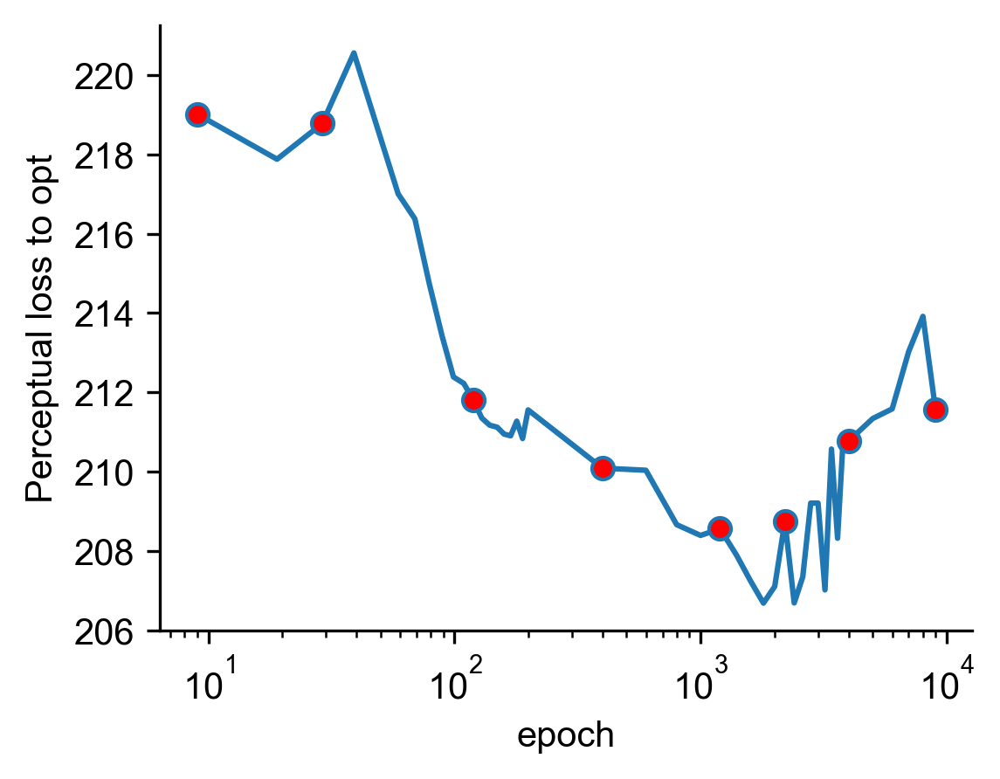

In [19]:
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(index_all, metric_df['Perceptual loss to opt'], label='loss'
         , markevery=[0, 2, 11, 20, 24, 29, 38, 43], marker='o', mfc='red'
         )
plt.xlabel('epoch')
plt.ylabel('Perceptual loss to opt')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

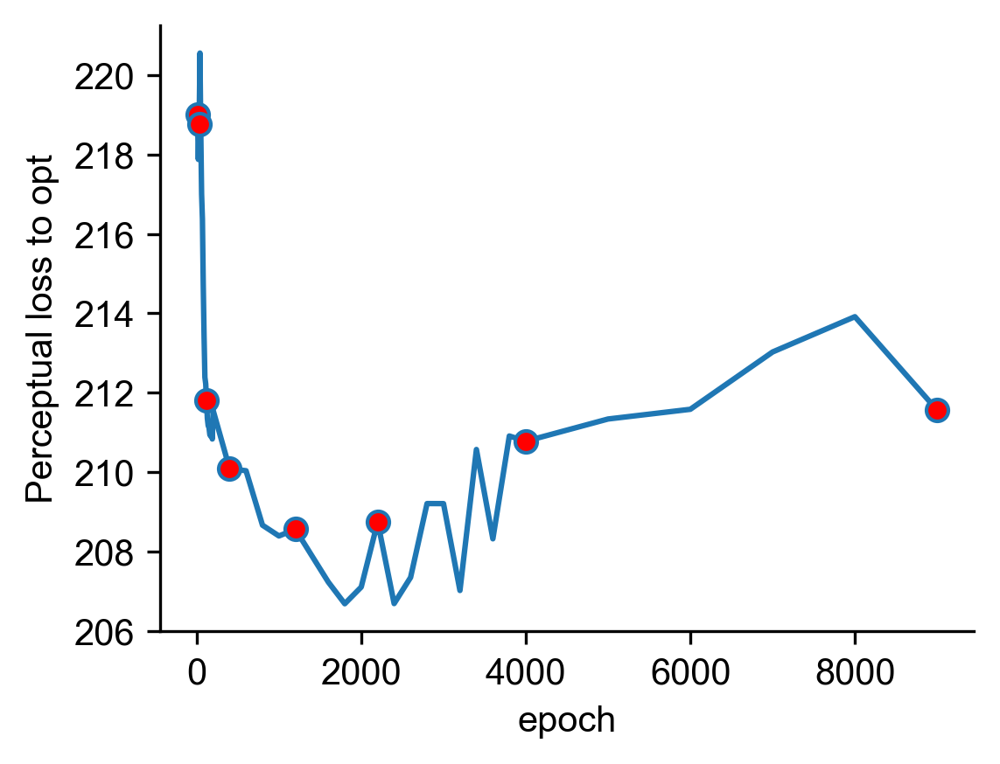

In [14]:
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(index_all, metric_df['Perceptual loss to opt'], label='loss'
         , markevery=[0, 2, 11, 20, 24, 29, 38, 43], marker='o', mfc='red'
         )
plt.xlabel('epoch')
plt.ylabel('Perceptual loss to opt')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
# ax.set_xscale('log')

In [15]:
metric_df

,SSIM to opt,PSNR to opt,SSIM to msi,PSNR to msi,Perceptual loss to opt,Perceptual loss to msi
9,-0.099564,2.832724,0.364693,15.842793,219.013901,243.906921
19,-0.109142,2.847507,0.369103,15.756495,217.877319,239.340851
29,-0.103897,2.863282,0.371562,15.646705,218.776154,238.191544
39,-0.104097,2.894937,0.374652,15.281840,220.556519,239.316544
49,-0.096711,2.899195,0.377155,15.380885,218.594528,238.094986
59,-0.084486,2.902377,0.375798,15.373646,217.005203,235.360260
69,-0.075898,2.905603,0.379629,15.412479,216.373260,235.160553
79,-0.044089,2.920159,0.383419,15.444050,214.734360,234.215958
89,-0.032803,2.924250,0.383144,15.401837,213.419601,232.543716
99,-0.017114,2.934103,0.383515,15.377998,212.388016,231.786743


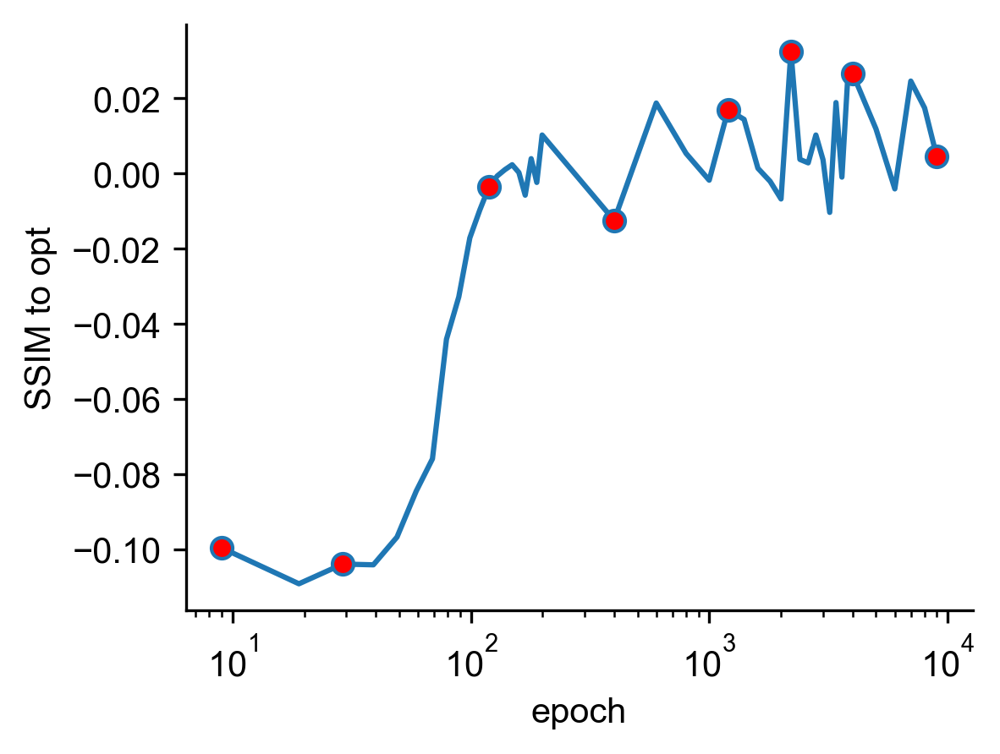

In [21]:
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(index_all, metric_df['SSIM to opt'], label='loss'
         , markevery=[0, 2, 11, 20, 24, 29, 38, 43], marker='o', mfc='red'
         )
plt.xlabel('epoch')
plt.ylabel('SSIM to opt')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

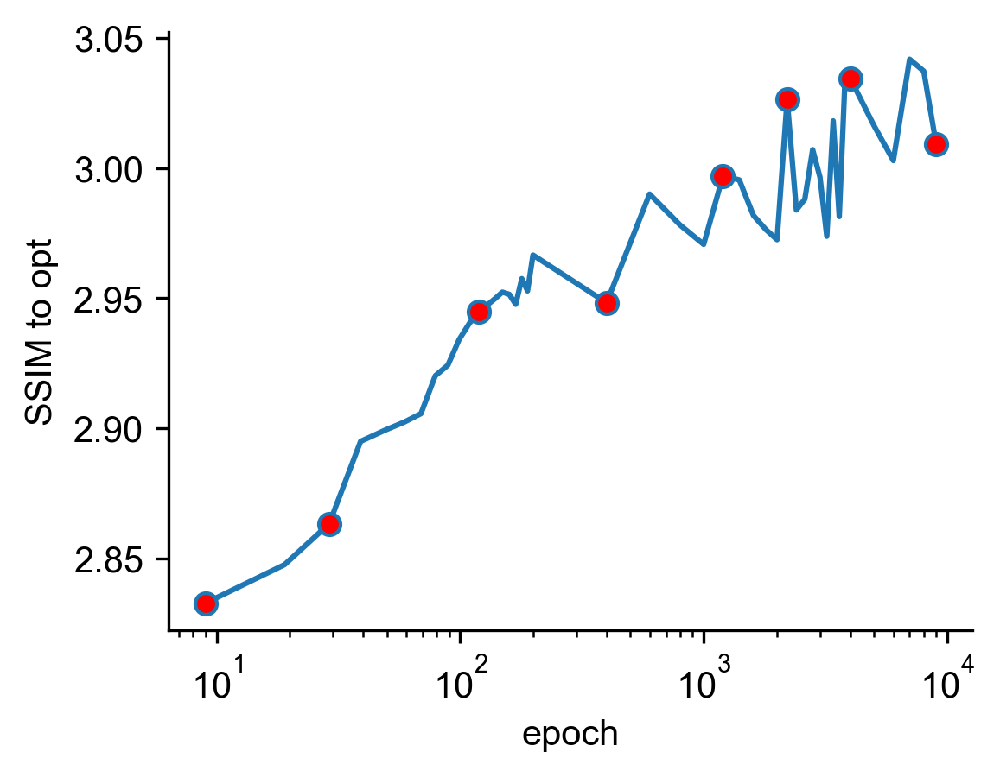

In [22]:
plt.figure(figsize=(4, 3), dpi=300)
plt.plot(index_all, metric_df['PSNR to opt'], label='loss'
         , markevery=[0, 2, 11, 20, 24, 29, 38, 43], marker='o', mfc='red'
         )
plt.xlabel('epoch')
plt.ylabel('SSIM to opt')
ax=plt.gca()
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xscale('log')

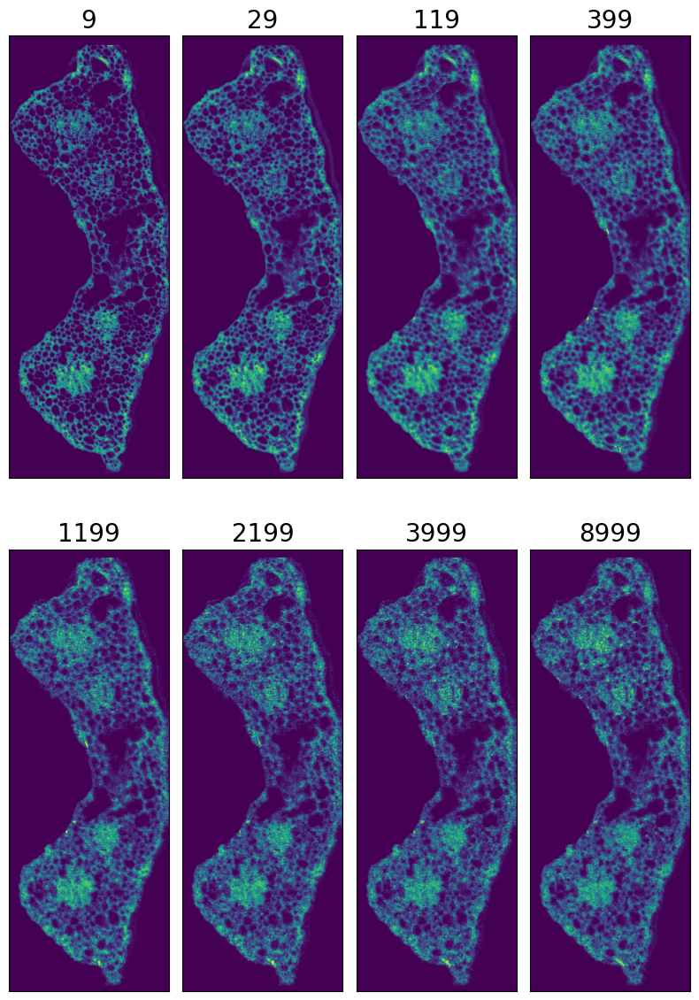

In [112]:
_, axes = plt.subplots(2,4,subplot_kw = {"xticks":[],"yticks":[]} # row, col
                            , figsize = (1*4*2, 3*2*2)  # figsize = (width, height)
                        )                               # pic_w*col*n, pic_h*row*n
for i, ax in enumerate(axes.flat):
    ax.imshow(img_list[indice[i]])
    ax.set_title(f'{index_all[indice[i]]}', fontsize = 20, color = 'black')
plt.tight_layout()
plt.show()

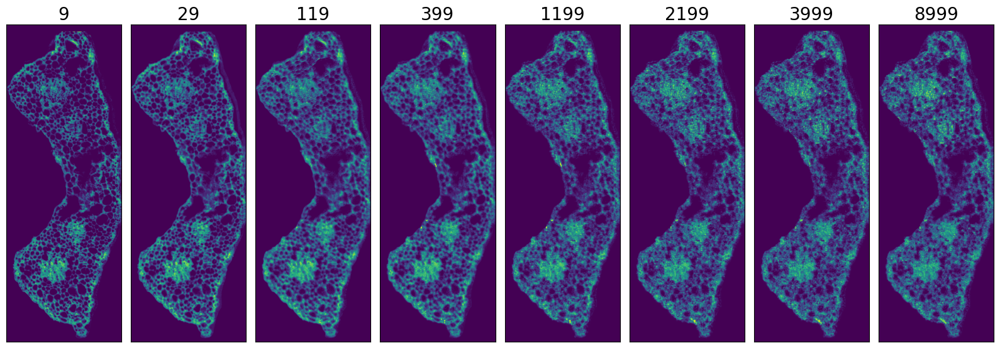

In [113]:
_, axes = plt.subplots(1,8,subplot_kw = {"xticks":[],"yticks":[]} # row, col
                            , figsize = (1*8*2, 3*1*2)  # figsize = (width, height)
                        )                               # pic_w*col*n, pic_h*row*n
for i, ax in enumerate(axes.flat):
    ax.imshow(img_list[indice[i]])
    ax.set_title(f'{index_all[indice[i]]}', fontsize = 20, color = 'black')
plt.tight_layout()
plt.show()